In [1]:
import numpy as np
import pandas as pd
import polars as pl
import os
import gc
import json
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import zarr

gc.enable()

pd.options.display.max_columns = None
#pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)

#pl.Config.set_tbl_rows(-1)
pl.Config.set_tbl_cols(-1)
pl.Config.set_fmt_str_lengths(10000)

polars.config.Config

In [2]:
path = 'I:/Kaggle/czii-cryo-et-object-identification/'

In [3]:
%%time
# Load the first zarr.
test_z_ts_6_4_denoised = zarr.open(path + '/test/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr', mode='r')
train_z_ts_6_4_denoised = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr', mode='r')
train_z_ts_6_4_iso = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/isonetcorrected.zarr', mode='r')
train_z_ts_6_4_dcon = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/ctfdeconvolved.zarr', mode='r')
train_z_ts_6_4_wbp = zarr.open(path + '/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/wbp.zarr', mode='r')

CPU times: total: 0 ns
Wall time: 25.9 ms


In [4]:
print(train_z_ts_6_4_denoised)
print(train_z_ts_6_4_denoised['0'].shape)
print(train_z_ts_6_4_denoised['1'].shape)
print(train_z_ts_6_4_denoised['2'].shape)

<Group file://I:/Kaggle/czii-cryo-et-object-identification/train/static/ExperimentRuns/TS_6_4/VoxelSpacing10.000/denoised.zarr>
(184, 630, 630)
(92, 315, 315)
(46, 158, 158)


# Ribosome Identification

Now that we can plot the images the next step is to try to identify structures of interest. Lists of those structures for TS_6_4 are in the train/overlay directory. We'll start with ribosomes.

Find all of the ribosomes between 600 and 650 in the z-axis, and plot them on slide 62 to see if we get something reasonable. If we do that suggests the origin is in the upper left in the x and y directions, and in the first image in the z direction.

In [5]:
ribosomes_x = []
ribosomes_y = []
with open(path + 'train/overlay/ExperimentRuns/TS_6_4/Picks/ribosome.json') as f:
    for p in json.loads(f.read())['points']:
        z = float(p['location']['z'])
        if z >= 600 and z < 650:
            ribosomes_x.append(float(p['location']['x'])/10)
            ribosomes_y.append(float(p['location']['y'])/10)
            print(p['location'])

{'x': 5274.903, 'y': 5288.121, 'z': 619.798}
{'x': 5312.439, 'y': 4964.156, 'z': 602.574}
{'x': 5130.837, 'y': 5121.036, 'z': 631.702}
{'x': 5106.838, 'y': 4835.263, 'z': 619.225}
{'x': 1273.648, 'y': 4386.703, 'z': 631.656}
{'x': 440.984, 'y': 3866.177, 'z': 643.857}
{'x': 1015.725, 'y': 640.198, 'z': 622.387}


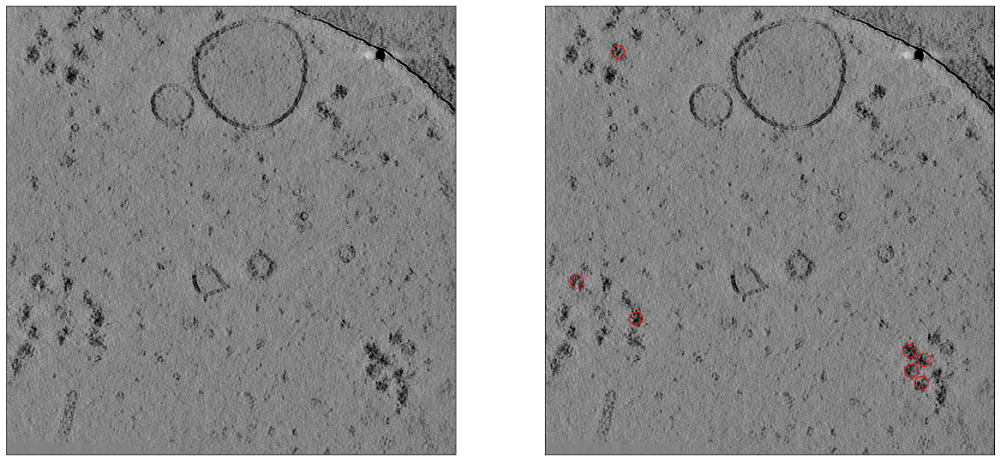

In [6]:
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][62], cmap='grey', vmin=-0.00005, vmax=0.00005)
ax = plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][62], cmap='grey', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter(ribosomes_x, ribosomes_y, s=matplotlib.rcParams['lines.markersize'] ** 3, edgecolor='red', facecolor='none')

Looking at the plotted images, we seem to have compelling matches.

# Virus Identification

Repeat the same process for viruses except with a different z-value.

In [7]:
virus_x = []
virus_y = []
with open(path + 'train/overlay/ExperimentRuns/TS_6_4/Picks/virus-like-particle.json') as f:
    for p in json.loads(f.read())['points']:
        z = float(p['location']['z'])
        if z >= 670 and z < 700:
            virus_x.append(float(p['location']['x'])/10)
            virus_y.append(float(p['location']['y'])/10)
            print(p['location'])

{'x': 911.29, 'y': 5638.402, 'z': 671.21}
{'x': 5580.108, 'y': 1240.86, 'z': 692.222}
{'x': 4765.58, 'y': 3469.964, 'z': 689.813}


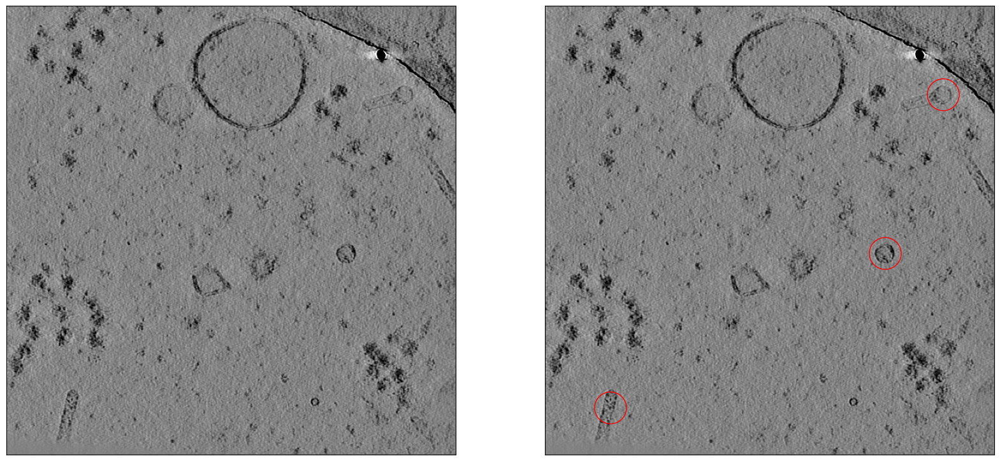

In [8]:
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][68], cmap='gray', vmin=-0.00005, vmax=0.00005)
ax = plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][68], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter(virus_x, virus_y, s=matplotlib.rcParams['lines.markersize'] ** 4, edgecolor='red', facecolor='none')

# Apo-Ferritin Identification

In [9]:
apo_ferritin_x = []
apo_ferritin_y = []
with open(path + 'train/overlay/ExperimentRuns/TS_6_4/Picks/apo-ferritin.json') as f:
    for p in json.loads(f.read())['points']:
        z = float(p['location']['z'])
        if z >= 400 and z < 450:
            apo_ferritin_x.append(float(p['location']['x'])/10)
            apo_ferritin_y.append(float(p['location']['y'])/10)
            print(p['location'])

{'x': 1019.831, 'y': 1859.831, 'z': 400.424}
{'x': 3534.854, 'y': 2407.485, 'z': 425.439}
{'x': 3752.045, 'y': 2505.17, 'z': 411.989}
{'x': 3942.417, 'y': 2660.695, 'z': 413.609}
{'x': 4009.57, 'y': 2947.043, 'z': 412.634}
{'x': 4243.778, 'y': 2985.682, 'z': 420.398}
{'x': 3596.958, 'y': 2593.013, 'z': 415.516}
{'x': 3486.946, 'y': 2616.549, 'z': 415.516}
{'x': 3631.179, 'y': 2496.627, 'z': 415.516}


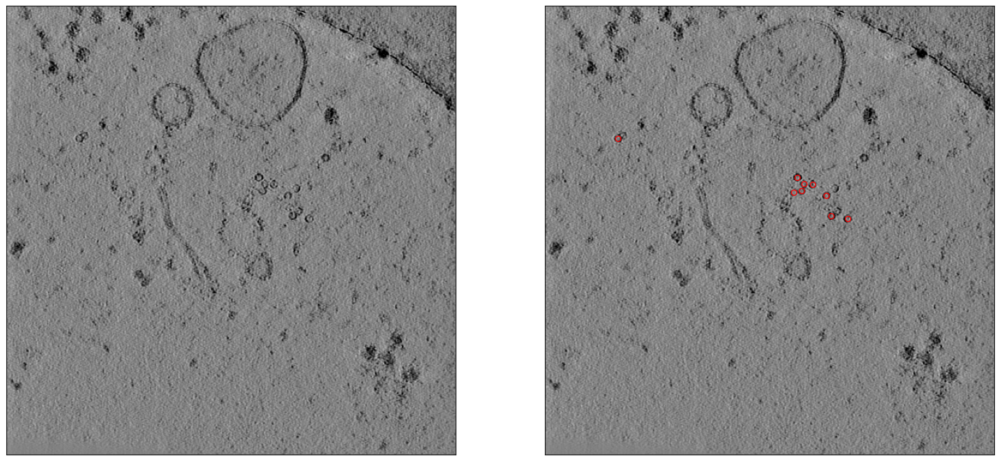

In [10]:
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][42], cmap='gray', vmin=-0.00005, vmax=0.00005)
ax = plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][42], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter(apo_ferritin_x, apo_ferritin_y, edgecolor='red', facecolor='none')

# Beta-Galactosidase Identification

In [11]:
beta_galactosidase_x = []
beta_galactosidase_y = []
with open(path + 'train/overlay/ExperimentRuns/TS_6_4/Picks/beta-galactosidase.json') as f:
    for p in json.loads(f.read())['points']:
        z = float(p['location']['z'])
        if z >= 450 and z < 500:
            beta_galactosidase_x.append(float(p['location']['x'])/10)
            beta_galactosidase_y.append(float(p['location']['y'])/10)
            print(p['location'])

{'x': 804.615, 'y': 1977.846, 'z': 489.385}
{'x': 4130.0, 'y': 3716.667, 'z': 465.0}


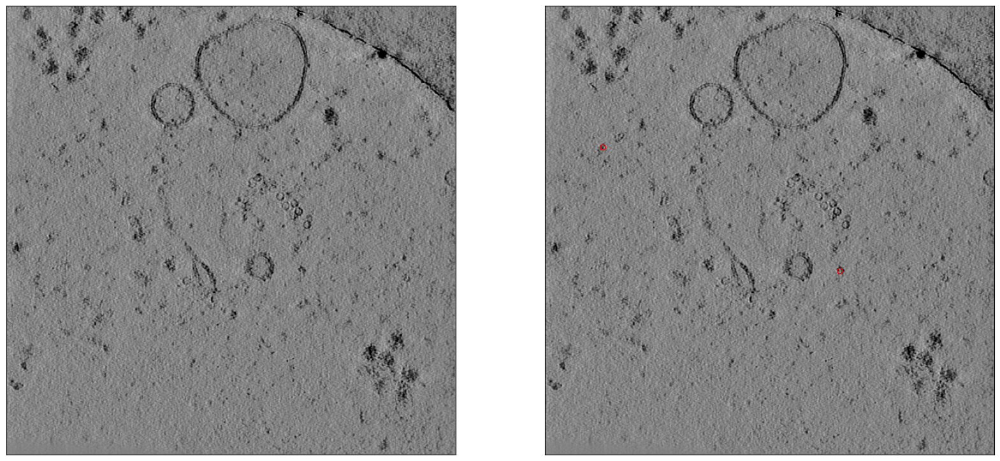

In [16]:
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][47], cmap='gray', vmin=-0.00005, vmax=0.00005)
ax = plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][47], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter(beta_galactosidase_x, beta_galactosidase_y, s=matplotlib.rcParams['lines.markersize'] ** 2, edgecolor='red', facecolor='none')

# Thyroglobulin Identification

In [17]:
thyroglobulin_x = []
thyroglobulin_y = []
with open(path + 'train/overlay/ExperimentRuns/TS_6_4/Picks/thyroglobulin.json') as f:
    for p in json.loads(f.read())['points']:
        z = float(p['location']['z'])
        if z >= 550 and z < 600:
            thyroglobulin_x.append(float(p['location']['x'])/10)
            thyroglobulin_y.append(float(p['location']['y'])/10)
            print(p['location'])

{'x': 1242.919, 'y': 1464.644, 'z': 581.353}
{'x': 3547.616, 'y': 4770.646, 'z': 595.253}
{'x': 4756.011, 'y': 4447.041, 'z': 581.386}
{'x': 3553.393, 'y': 2129.821, 'z': 561.696}


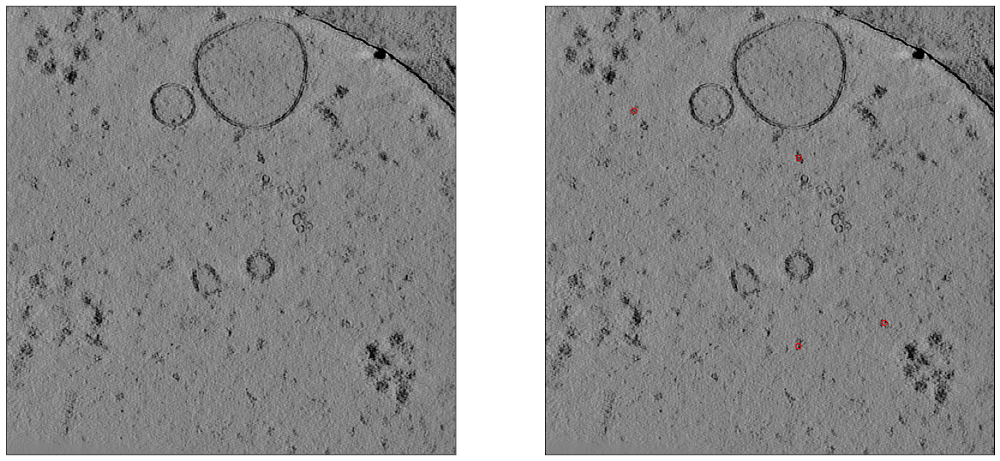

In [18]:
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][57], cmap='gray', vmin=-0.00005, vmax=0.00005)
ax = plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(train_z_ts_6_4_denoised['0'][57], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter(thyroglobulin_x, thyroglobulin_y, edgecolor='red', facecolor='none')

# Ribosome Close-Up

The following are zoomed in images of a ribosome from three perspectives, straight on, from the right side (front is to the left) and from the top (front is to the bottom.) Somewhat unexpected is the difference in image quality from the sides and top.

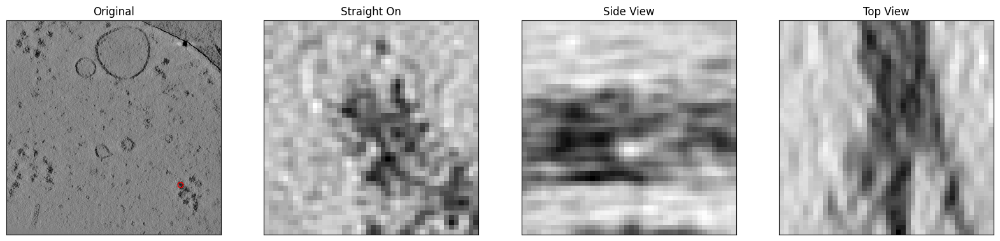

In [19]:
# {'x': 5106.838, 'y': 4835.263, 'z': 619.225}
fig = plt.figure(figsize=(20, 5))
ax = plt.subplot(1, 4, 1)
plt.xticks([])
plt.yticks([])
plt.title('Original')
plt.imshow(train_z_ts_6_4_denoised['0'][61], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter([5106.838/10], [4835.263/10], edgecolor='red', facecolor='none')
ax = plt.subplot(1, 4, 2)
plt.xticks([])
plt.yticks([])
plt.title('Straight On')
plt.imshow(train_z_ts_6_4_denoised['0'][61, 461:505, 488:532], cmap='gray')
ax = plt.subplot(1, 4, 3)
plt.xticks([])
plt.yticks([])
plt.title('Side View')
plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[510, 461:505, 39:83], cmap='gray')
ax = plt.subplot(1, 4, 4)
plt.xticks([])
plt.yticks([])
plt.title('Top View')
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[483, 39:83, 488:532], cmap='gray')

# Virus Close-Up

Same for virus, although I don't believe this captures the full virus. In the images above, there is an elongated structure protruding down an to the left.

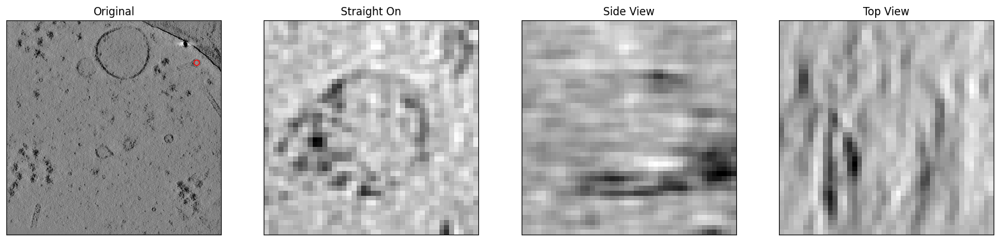

In [20]:
# {'x': 5580.108, 'y': 1240.86, 'z': 692.222}
fig = plt.figure(figsize=(20, 5))
ax = plt.subplot(1, 4, 1)
plt.xticks([])
plt.yticks([])
plt.title('Original')
plt.imshow(train_z_ts_6_4_denoised['0'][69], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter([5580.108/10], [1240.86/10], edgecolor='red', facecolor='none')
ax = plt.subplot(1, 4, 2)
plt.xticks([])
plt.yticks([])
plt.title('Straight On')
plt.imshow(train_z_ts_6_4_denoised['0'][69, 102:146, 536:580], cmap='gray')
ax = plt.subplot(1, 4, 3)
plt.xticks([])
plt.yticks([])
plt.title('Side View')
plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[558, 102:146, 47:91], cmap='gray')
ax = plt.subplot(1, 4, 4)
plt.xticks([])
plt.yticks([])
plt.title('Top View')
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[124, 47:91, 536:580], cmap='gray')

# Apo-Ferritin Close-Up

Here the particle is difficult to discerne from the side and top.

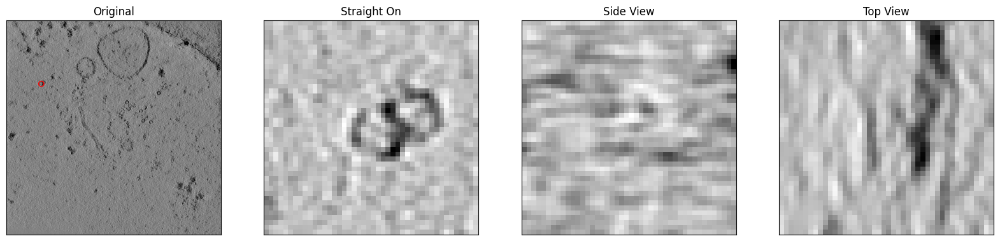

In [21]:
# {'x': 1019.831, 'y': 1859.831, 'z': 400.424}
fig = plt.figure(figsize=(20, 5))
ax = plt.subplot(1, 4, 1)
plt.xticks([])
plt.yticks([])
plt.title('Original')
plt.imshow(train_z_ts_6_4_denoised['0'][40], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter([1019.831/10], [1859.831/10], edgecolor='red', facecolor='none')
ax = plt.subplot(1, 4, 2)
plt.xticks([])
plt.yticks([])
plt.title('Straight On')
plt.imshow(train_z_ts_6_4_denoised['0'][40, 163:207, 79:123], cmap='gray')
ax = plt.subplot(1, 4, 3)
plt.xticks([])
plt.yticks([])
plt.title('Side View')
plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[101, 163:207, 18:62], cmap='gray')
ax = plt.subplot(1, 4, 4)
plt.xticks([])
plt.yticks([])
plt.title('Top View')
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[185, 18:62, 79:123], cmap='gray')

# Beta-Galactosidase Close-Up

Same for beta-galactosidase.

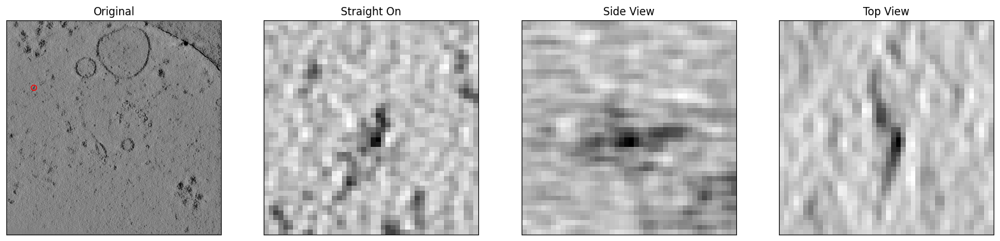

In [23]:
# {'x': 804.615, 'y': 1977.846, 'z': 489.385}
fig = plt.figure(figsize=(20, 5))
ax = plt.subplot(1, 4, 1)
plt.xticks([])
plt.yticks([])
plt.title('Original')
plt.imshow(train_z_ts_6_4_denoised['0'][48], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter([804.615/10], [1977.846/10], edgecolor='red', facecolor='none')
ax = plt.subplot(1, 4, 2)
plt.xticks([])
plt.yticks([])
plt.title('Straight On')
plt.imshow(train_z_ts_6_4_denoised['0'][48, 175:219, 58:102], cmap='gray')
ax = plt.subplot(1, 4, 3)
plt.xticks([])
plt.yticks([])
plt.title('Side View')
plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[80, 175:219, 26:70], cmap='gray')
ax = plt.subplot(1, 4, 4)
plt.xticks([])
plt.yticks([])
plt.title('Top View')
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[197, 26:70, 58:102], cmap='gray')

# Thyroglobulin Close-Up

Same for thyroglobulin.

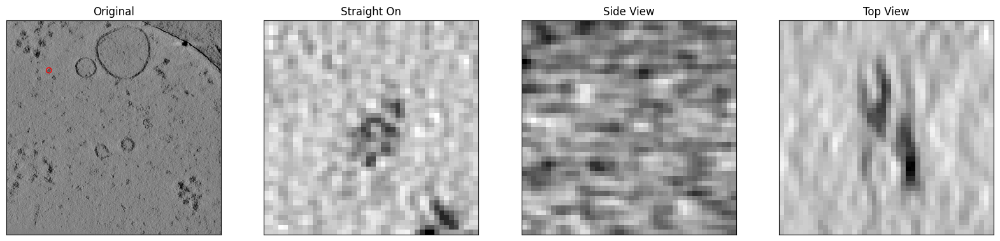

In [25]:
# {'x': 1242.919, 'y': 1464.644, 'z': 581.353}
fig = plt.figure(figsize=(20, 5))
ax = plt.subplot(1, 4, 1)
plt.xticks([])
plt.yticks([])
plt.title('Original')
plt.imshow(train_z_ts_6_4_denoised['0'][58], cmap='gray', vmin=-0.00005, vmax=0.00005)
_ = plt.scatter([1242.919/10], [1464.644/10], edgecolor='red', facecolor='none')
ax = plt.subplot(1, 4, 2)
plt.xticks([])
plt.yticks([])
plt.title('Straight On')
plt.imshow(train_z_ts_6_4_denoised['0'][58, 124:168, 102:146], cmap='gray')
ax = plt.subplot(1, 4, 3)
plt.xticks([])
plt.yticks([])
plt.title('Side View')
plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[124, 175:219, 36:80], cmap='gray')
ax = plt.subplot(1, 4, 4)
plt.xticks([])
plt.yticks([])
plt.title('Top View')
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[146, 36:80, 102:146], cmap='gray')

# Low Res from the Side

Here is the low resolution version plotted from the rigth side moving from the far side to the near side. The point of doing this is to get a look at the overall image quality from the side.

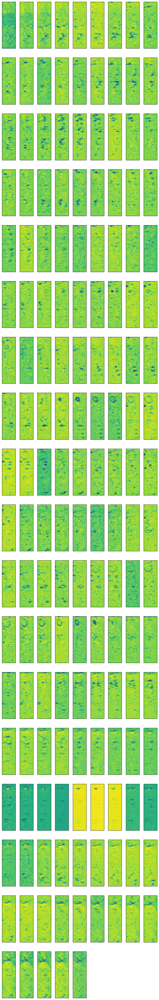

In [26]:
fig = plt.figure(figsize=(10,64))
for i in range(158):
    ax = plt.subplot(18, 9, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(np.transpose(train_z_ts_6_4_denoised['2'], axes=(2,1,0))[i])

# Low Res from the Top

Same idea from the top. Images proceed from top to bottom of the volume.

CPU times: total: 4.36 s
Wall time: 4.27 s


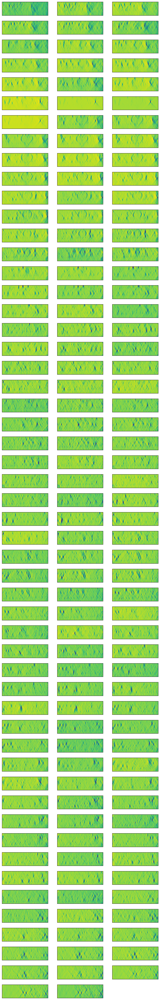

In [27]:
%%time
fig = plt.figure(figsize=(10,64))
for i in range(158):
    ax = plt.subplot(53, 3, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(np.transpose(train_z_ts_6_4_denoised['2'], axes=(1,0,2))[i])

# Deformation along the Z-axis

Returning to the ribosome, the same views are displayed with the side and top views elongated along the z-axis. A red circle is displayed to indicate the 150 unit radius around the central point. The images pretty clearly show that the ribosome does not stay within the radius.

## Straight On

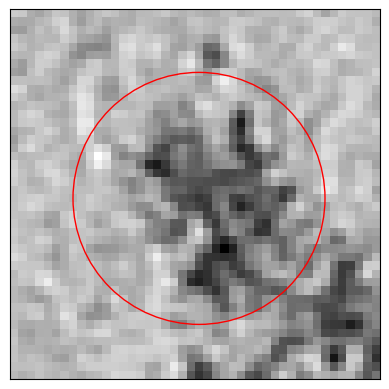

In [28]:
# {'x': 5106.838, 'y': 4835.263, 'z': 619.225}
plt.xticks([])
plt.yticks([])
circle = plt.Circle((22,22), radius=15, facecolor='none', edgecolor='r')
plt.gca().add_patch(circle)
_ = plt.imshow(train_z_ts_6_4_denoised['0'][61, 461:505, 488:532], cmap='gray')

## Side View

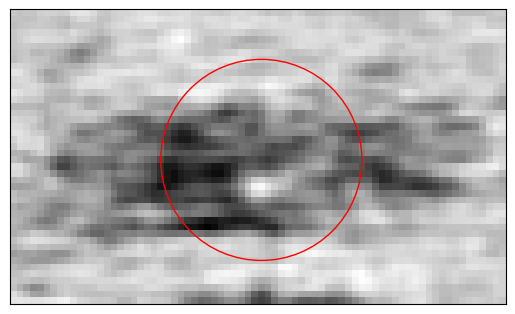

In [29]:
from matplotlib.patches import Circle
plt.xticks([])
plt.yticks([])
circle = plt.Circle((37,22), radius=15, facecolor='none', edgecolor='r')
plt.gca().add_patch(circle)
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(2,1,0))[510, 461:505, 24:98], cmap='gray')


## Top View

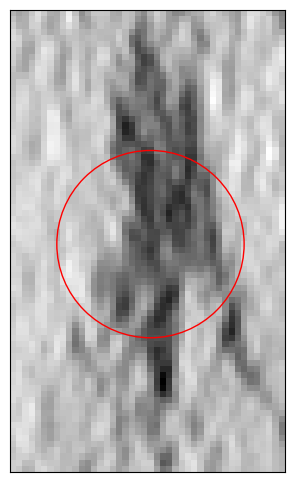

In [30]:
fig = plt.figure(figsize=(5,6))
plt.xticks([])
plt.yticks([])
circle = plt.Circle((22,37), radius=15, facecolor='none', edgecolor='r')
plt.gca().add_patch(circle)
_ = plt.imshow(np.transpose(train_z_ts_6_4_denoised['0'], axes=(1,0,2))[483, 24:98, 488:532], cmap='gray')

# References

1. https://www.kaggle.com/code/davidlist/experiment-ts-6-4-visualization
2. https://www.kaggle.com/code/nk35jk/3d-visualization-of-particles